In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
train = pd.read_csv('/content/drive/MyDrive/HD/train.csv')
test = pd.read_csv('/content/drive/MyDrive/HD/test.csv')
train.drop(['SAMPLE_ID'],axis=1,inplace=True)
test.drop(['SAMPLE_ID'],axis=1,inplace=True)
train

,ARI_CO,ARI_PO,SHIP_TYPE_CATEGORY,DIST,ATA,ID,BREADTH,BUILT,DEADWEIGHT,DEPTH,...,V_WIND,AIR_TEMPERATURE,BN,ATA_LT,DUBAI,BRENT,WTI,BDI_ADJ,PORT_SIZE,CI_HOUR
0,CN,EKP8,Bulk,30.736578,2020-10-15 4:03,Z517571,30.0,28,73100,20.0,...,3.77,15.9,2.730798,12,42.01,43.16,40.96,1407.668330,0.001660,3.048333
1,CN,EUC8,Container,63.220425,2019-09-17 2:55,U467618,30.0,15,37900,20.0,...,-6.72,24.5,4.289058,10,67.53,64.55,59.34,2089.046774,0.001614,17.138611
2,CN,NGG6,Container,90.427421,2019-02-23 6:43,V378315,50.0,7,115000,20.0,...,0.00,9.4,0.000000,14,65.30,66.39,56.94,603.193047,0.001743,98.827500
3,JP,TMR7,Cargo,0.000000,2020-09-18 22:06,B726632,10.0,33,1490,10.0,...,-7.31,22.1,4.693735,7,43.02,43.15,41.11,1169.853455,0.000069,0.000000
4,RU,NNC2,Container,8.813725,2022-08-13 12:57,D215135,30.0,10,27600,10.0,...,2.31,22.8,2.345875,14,90.45,93.65,88.11,1107.944894,0.000197,96.030556
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
367436,CN,YRT6,Bulk,59.018184,2017-11-11 22:23,J661243,40.0,13,93200,20.0,...,NaN,NaN,NaN,6,61.25,62.21,55.70,1333.609109,0.000360,65.850000
367437,JP,QYY1,Tanker,0.000000,2022-04-29 2:58,D847216,10.0,9,1280,0.0,...,0.87,17.1,1.028558,11,105.37,109.34,104.69,1955.103846,0.000552,0.000000
367438,SG,GIW5,Container,1.768630,2022-07-14 7:58,Q635545,30.0,6,25000,20.0,...,3.36,31.7,2.557156,15,97.73,99.10,95.78,1601.291086,0.002615,0.997500
367439,JP,TMR7,Cargo,0.000000,2020-12-22 10:07,N211282,10.0,8,2400,10.0,...,-2.44,10.8,3.055715,19,49.75,50.08,47.02,1191.353331,0.000069,0.000000


In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 367441 entries, 0 to 367440
Data columns (total 26 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   ARI_CO              367441 non-null  object 
 1   ARI_PO              367441 non-null  object 
 2   SHIP_TYPE_CATEGORY  367441 non-null  object 
 3   DIST                367441 non-null  float64
 4   ATA                 367441 non-null  object 
 5   ID                  367441 non-null  object 
 6   BREADTH             367440 non-null  float64
 7   BUILT               367441 non-null  int64  
 8   DEADWEIGHT          367441 non-null  int64  
 9   DEPTH               367440 non-null  float64
 10  DRAUGHT             367440 non-null  float64
 11  GT                  367441 non-null  int64  
 12  LENGTH              367440 non-null  float64
 13  SHIPMANAGER         367441 non-null  object 
 14  FLAG                367441 non-null  object 
 15  U_WIND              213955 non-nul

In [ ]:
print(train['ARI_CO'].nunique(), test['ARI_CO'].nunique())
print(train['ARI_PO'].nunique(), test['ARI_PO'].nunique())
print(train['SHIP_TYPE_CATEGORY'].nunique(), test['SHIP_TYPE_CATEGORY'].nunique())
print(train['ID'].nunique(), test['ID'].nunique())
print(train['SHIPMANAGER'].nunique(), test['SHIPMANAGER'].nunique())
print(train['FLAG'].nunique(), test['FLAG'].nunique())

25 25
103 103
4 4
24764 23249
6511 6195
123 119


In [ ]:
# ATA 피처를 datetime 형식으로 변환
train['ATA'] = pd.to_datetime(train['ATA'])

# 'year', 'month', 'day', 'rounded_hour' 피처 추출
train['year'] = train['ATA'].dt.year
train['month'] = train['ATA'].dt.month
train['day'] = train['ATA'].dt.day
train['hour'] = train['ATA'].dt.hour
train['minute'] = train['ATA'].dt.minute
train['weekday'] = train['ATA'].dt.dayofweek
train['rounded_hour'] = train['hour'] + (train['minute'] // 30)

# ARI_PO, year, month, day, rounded_hour가 동일한 샘플들을 필터링
duplicates = train[train.duplicated(subset=['ARI_PO', 'year', 'month', 'day', 'rounded_hour'], keep=False)]

duplicates_sorted = duplicates.sort_values(by=['ARI_PO', 'year', 'month', 'day', 'rounded_hour'])
duplicates_sorted = duplicates_sorted.reset_index(drop = True)
duplicates_sorted.to_csv('compare.csv',index=False)
duplicates_sorted

,ARI_CO,ARI_PO,SHIP_TYPE_CATEGORY,DIST,ATA,ID,BREADTH,BUILT,DEADWEIGHT,DEPTH,...,BDI_ADJ,PORT_SIZE,CI_HOUR,year,month,day,hour,minute,weekday,rounded_hour
0,AU,AIB7,Bulk,45.939559,2014-09-01 01:15:00,R523348,40.0,11,107000,20.0,...,1141.586111,0.000113,95.507222,2014,9,1,1,15,0,1
1,AU,AIB7,Bulk,0.000000,2014-09-01 01:09:00,Q184814,30.0,14,32500,10.0,...,1137.632567,0.000113,0.000000,2014,9,1,1,9,0,1
2,AU,AIB7,Bulk,35.575496,2014-09-01 01:03:00,R145657,30.0,20,53000,20.0,...,1141.586111,0.000113,95.767500,2014,9,1,1,3,0,1
3,AU,AIB7,Bulk,0.000000,2014-09-01 01:05:00,Q434522,30.0,9,80500,20.0,...,1137.632567,0.000113,0.000000,2014,9,1,1,5,0,1
4,AU,AIB7,Bulk,0.000000,2014-09-01 01:06:00,X368581,40.0,29,151000,20.0,...,1137.632567,0.000113,0.000000,2014,9,1,1,6,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90342,JP,ZAG4,Tanker,10.283141,2023-02-09 16:19:00,S384818,10.0,12,970,0.0,...,468.429554,0.000356,7.698611,2023,2,9,16,19,3,16
90343,JP,ZAG4,Cargo,10.254468,2023-02-09 15:52:00,S337765,10.0,6,2240,10.0,...,460.648332,0.000356,8.094167,2023,2,9,15,52,3,16
90344,JP,ZAG4,Cargo,8.046199,2023-02-09 16:24:00,E818625,20.0,26,9630,10.0,...,468.429554,0.000356,8.216389,2023,2,9,16,24,3,16
90345,JP,ZAG4,Cargo,10.664569,2023-02-23 21:45:00,T142322,10.0,18,1550,10.0,...,687.081887,0.000356,3.744167,2023,2,23,21,45,3,22


In [ ]:
train[(train['DIST'] == 0) & (train['CI_HOUR'] > 10)]

,ARI_CO,ARI_PO,SHIP_TYPE_CATEGORY,DIST,ATA,ID,BREADTH,BUILT,DEADWEIGHT,DEPTH,...,WTI,BDI_ADJ,PORT_SIZE,CI_HOUR,year,month,day,hour,minute,rounded_hour
7134,JP,SPG1,Cargo,0.0,2021-05-02 22:14:00,Y714156,10.0,4,900,10.0,...,68.81,2144.542846,0.000058,755.989444,2021,5,2,22,14,22
9332,SG,GIW5,Tanker,0.0,2022-02-14 10:58:00,B185346,10.0,32,2180,10.0,...,91.76,1555.391708,0.002615,62.012778,2022,2,14,10,58,11
101097,SG,GIW5,Cargo,0.0,2021-05-10 01:06:00,W363516,30.0,12,33500,10.0,...,65.49,2443.860191,0.002615,191.500278,2021,5,10,1,6,1
102029,JP,TMR7,Cargo,0.0,2020-12-13 22:40:00,B226876,10.0,14,2200,10.0,...,48.36,1165.376454,0.000069,95.951667,2020,12,13,22,40,23
141890,JP,CSP6,Cargo,0.0,2021-08-12 18:56:00,C363524,10.0,2,1700,10.0,...,68.44,3067.423880,0.000006,11.499722,2021,8,12,18,56,19
214624,KR,BGD2,Bulk,0.0,2016-11-19 11:21:00,R468154,30.0,7,81400,20.0,...,46.06,1145.344463,0.000244,143.203889,2016,11,19,11,21,11
228215,JP,ZAG4,Cargo,0.0,2022-03-30 16:58:00,J315117,10.0,10,1270,0.0,...,101.70,1955.103846,0.000356,634.015278,2022,3,30,16,58,17
295926,JP,ZAG4,Tanker,0.0,2022-03-08 10:56:00,V572262,10.0,21,1180,0.0,...,108.70,2088.590200,0.000356,25.999167,2022,3,8,10,56,11
308244,CN,JTD1,Container,0.0,2022-01-04 10:06:00,L117585,50.0,11,99800,20.0,...,86.90,1224.264084,0.000557,388.824444,2022,1,4,10,6,10
315853,IN,QTU5,Bulk,0.0,2017-09-17 16:46:00,I273647,30.0,18,55600,20.0,...,51.67,1291.533118,0.000103,280.732778,2017,9,17,16,46,17


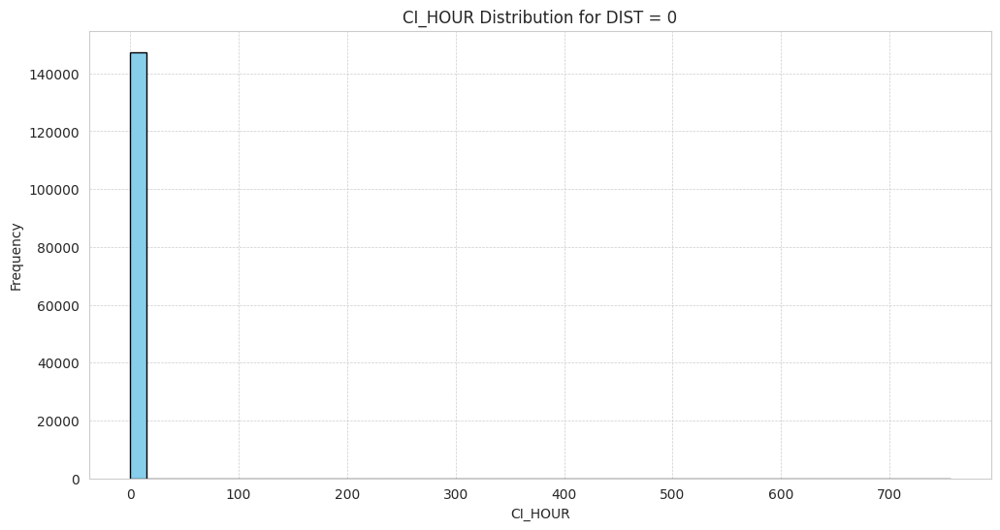

In [ ]:
# DIST가 0인 샘플들의 CI_HOUR 분포 시각화
dist_zero = train[train['DIST'] == 0]

plt.figure(figsize=(12, 6))
plt.hist(dist_zero['CI_HOUR'], bins=50, color='skyblue', edgecolor='black')
plt.title('CI_HOUR Distribution for DIST = 0')
plt.xlabel('CI_HOUR')
plt.ylabel('Frequency')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.show()

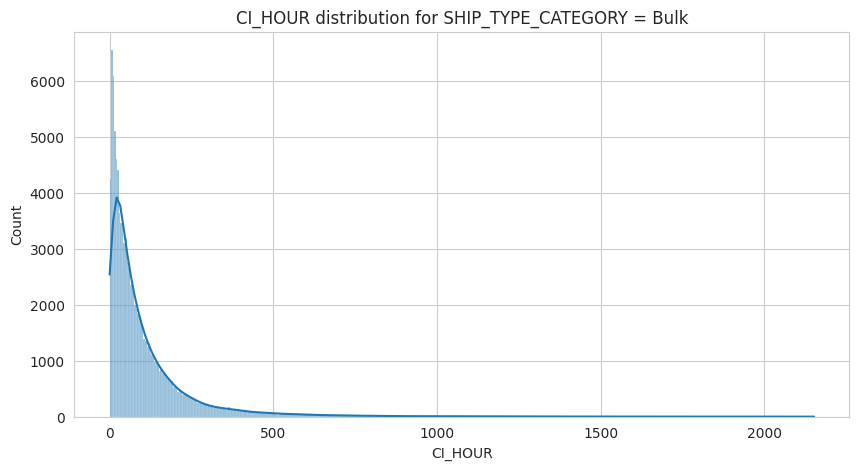

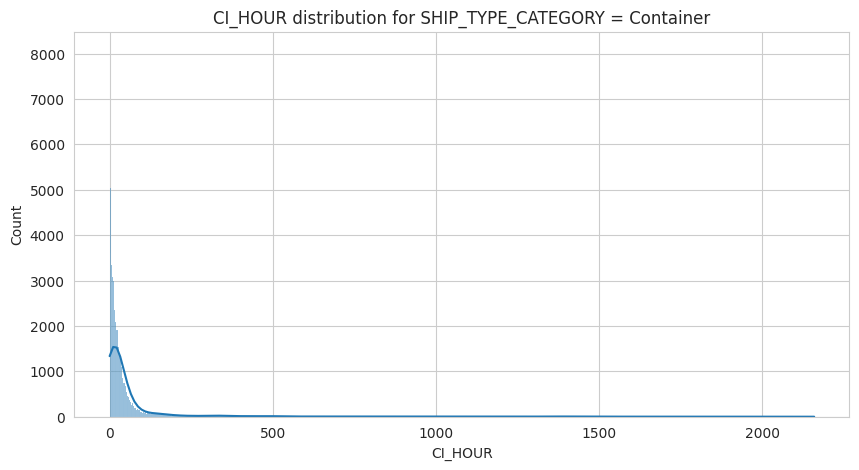

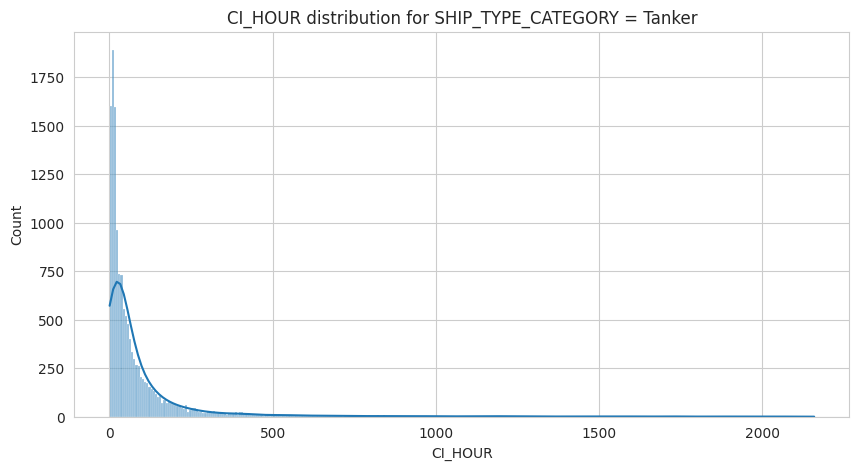

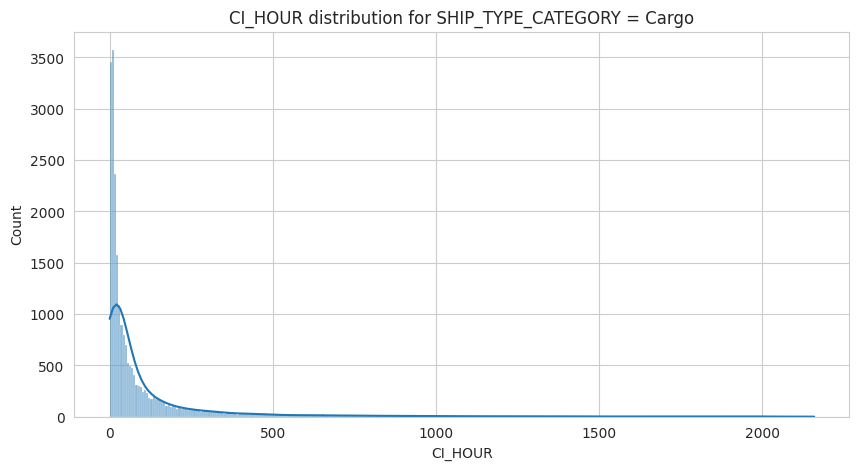

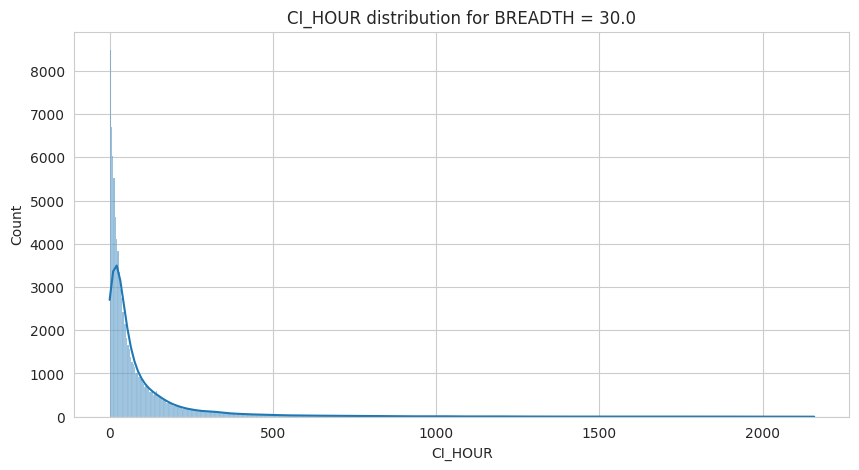

...

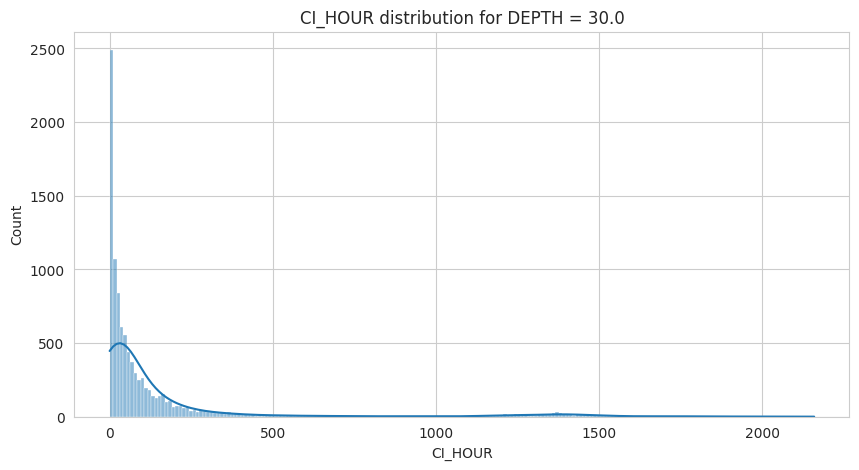

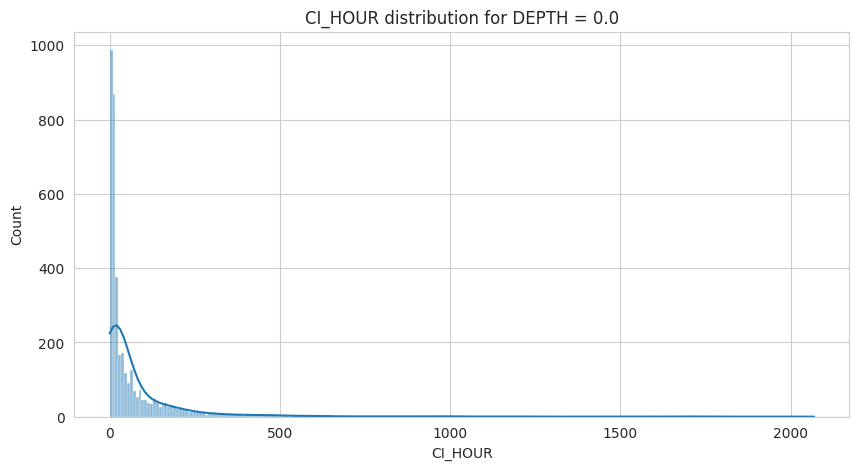

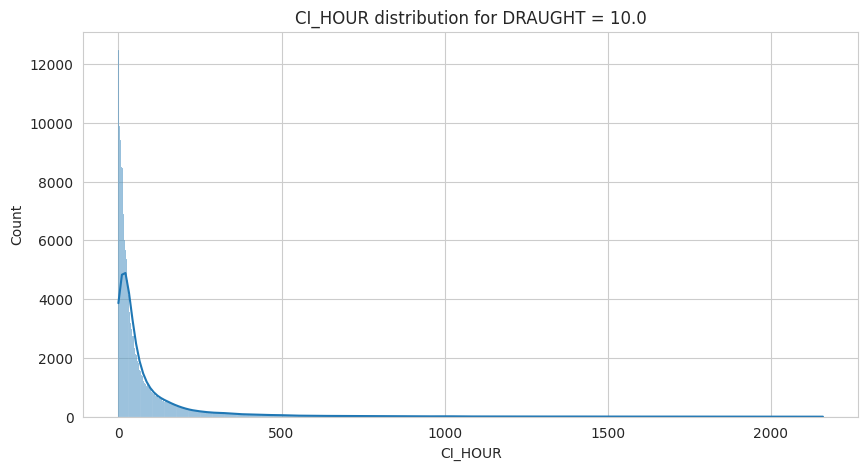

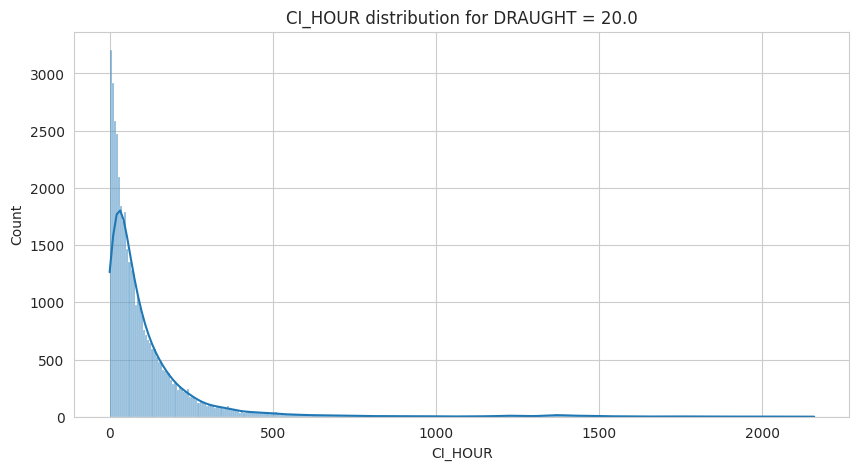

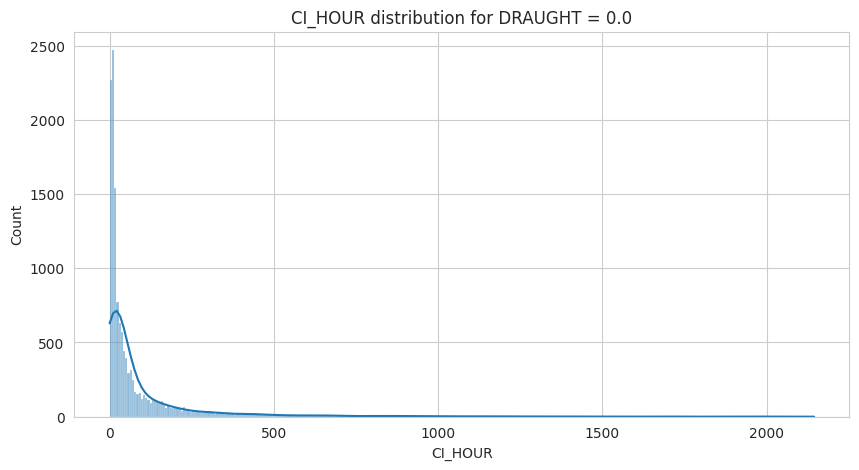

In [ ]:
# nunique 값이 20 이하인 피처들 선별
train = pd.read_csv('/content/drive/MyDrive/HD/train.csv')
train = train[train['DIST'] != 0]
low_nunique_features = train.columns[train.nunique() <= 20].tolist()

# 선별된 피처에 대해 각 유니크 값별 CI_HOUR 분포 시각화
for feature in low_nunique_features:
    unique_values = train[feature].unique()

    for value in unique_values:
        subset = train[train[feature] == value]

        plt.figure(figsize=(10, 5))
        sns.histplot(subset['CI_HOUR'], kde=True)
        plt.title(f'CI_HOUR distribution for {feature} = {value}')
        plt.xlabel('CI_HOUR')
        plt.ylabel('Count')
        plt.show()

<ipython-input-36-982d2fd10fe1>:48: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=subset, x=feature, y='mean', ci=None, palette="muted", edgecolor=".2")
<ipython-input-36-982d2fd10fe1>:48: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=subset, x=feature, y='mean', ci=None, palette="muted", edgecolor=".2")
<ipython-input-36-982d2fd10fe1>:48: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=subset, x=feature, y='mean', ci=None, palette="muted", edgecolor=".2")
<ipython-input-36-982d2fd10fe1>:48: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=subset, x=feature, y='mean', ci=None, palette="muted", edgecolor=".2")
<ipython-input-36-982d2fd10fe1>:48: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effe

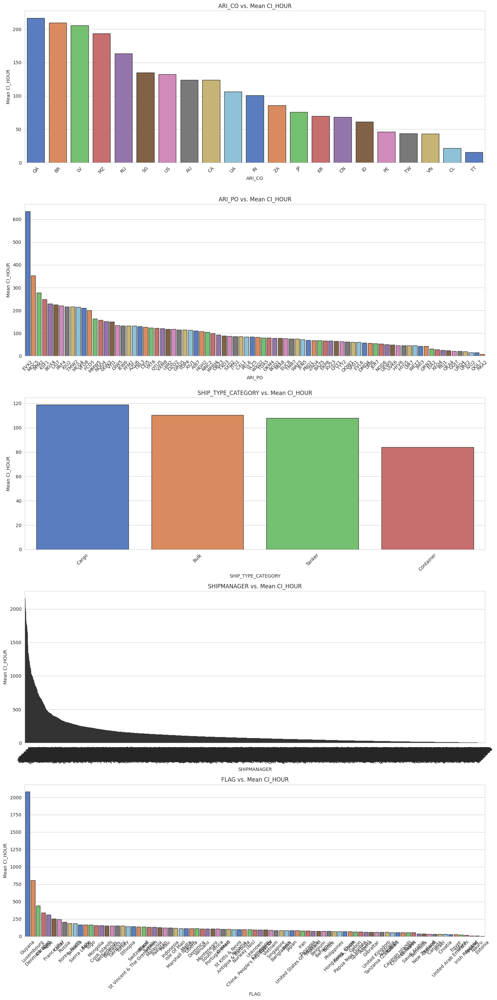

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
# 중요하지 않은 범주형 피처 제외
# 지정된 조건을 충족하는 샘플들 추출
# ATA 피처를 datetime 형식으로 변환
train['ATA'] = pd.to_datetime(train['ATA'])

# 'year', 'month', 'day', 'weekday', 'rounded_hour' 피처 생성
train['year'] = train['ATA'].dt.year
train['month'] = train['ATA'].dt.month
train['day'] = train['ATA'].dt.day
train['weekday'] = train['ATA'].dt.weekday
train['rounded_hour'] = train['ATA'].dt.round('H').dt.hour

duplicated_rows = train[train.duplicated(subset=['ARI_PO', 'year', 'month', 'day', 'rounded_hour'], keep=False)]

# 해당 샘플들의 개수 확인
duplicated_rows_count = duplicated_rows.shape[0]
important_categorical_features = ['ARI_CO', 'ARI_PO', 'SHIP_TYPE_CATEGORY', 'SHIPMANAGER', 'FLAG']

cat_feature_mean_median_filtered = {}

for feature in important_categorical_features:
    mean_median = duplicated_rows.groupby(feature)['CI_HOUR'].agg(['mean', 'median']).reset_index()
    mean_median['feature'] = feature
    cat_feature_mean_median_filtered[feature] = mean_median

# 결과를 하나의 DataFrame으로 합치기
combined_filtered_df = pd.concat(cat_feature_mean_median_filtered.values(), axis=0)

# 결과를 평균 CI_HOUR 값에 따라 내림차순으로 정렬
combined_filtered_df.sort_values(by='mean', ascending=False, inplace=True)

combined_filtered_df

plt.figure(figsize=(15, 30))

for idx, feature in enumerate(important_categorical_features, 1):
    plt.subplot(len(important_categorical_features), 1, idx)

    # 해당 피처에 대한 데이터만 필터링
    subset = combined_filtered_df[combined_filtered_df['feature'] == feature]

    # 평균값 기준으로 내림차순 정렬
    subset = subset.sort_values(by='mean', ascending=False)

    # 시각화
    sns.barplot(data=subset, x=feature, y='mean', ci=None, palette="muted", edgecolor=".2")
    plt.title(f"{feature} vs. Mean CI_HOUR")
    plt.ylabel("Mean CI_HOUR")
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()


In [ ]:
train['ARI_CO'].unique()

array(['CN', 'JP', 'RU', 'AU', 'SG', 'ZA', 'KR', 'TW', 'TT', 'ID', 'BR',
       'QA', 'LV', 'MZ', 'US', 'IN', 'UA', 'CA', 'MY', 'PE', 'VN', 'FI',
       'CL', 'VE', 'PH'], dtype=object)

In [ ]:
train['DRAUGHT']

0         10.0
1         10.0
2         10.0
3          0.0
4         10.0
          ... 
367436    10.0
367437     0.0
367438    10.0
367439     0.0
367440    10.0
Name: DRAUGHT, Length: 367441, dtype: float64

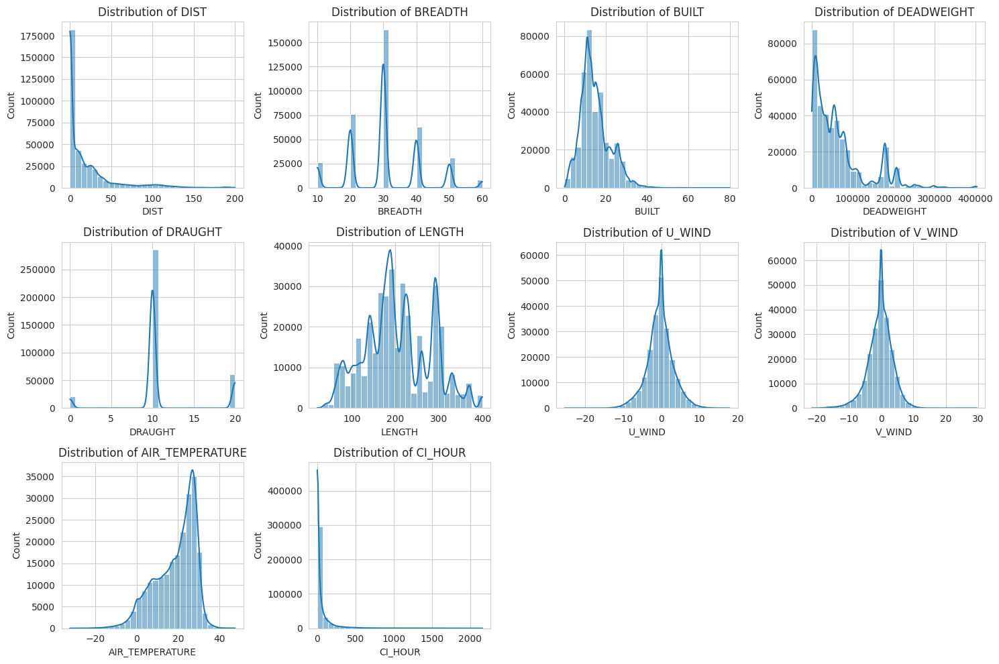

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# 시각화를 위한 설정
plt.figure(figsize=(15, 10))
sns.set_style("whitegrid")

# 선택적으로 시각화할 컬럼들
selected_columns = ['DIST', 'BREADTH', 'BUILT', 'DEADWEIGHT', 'DRAUGHT', 'LENGTH', 'U_WIND', 'V_WIND', 'AIR_TEMPERATURE', 'CI_HOUR']

# 선택된 컬럼들의 분포 시각화
for i, col in enumerate(selected_columns, 1):
    plt.subplot(3, 4, i)
    sns.histplot(train[col], bins=30, kde=True)
    plt.title(f'Distribution of {col}')
    plt.tight_layout()

plt.show()

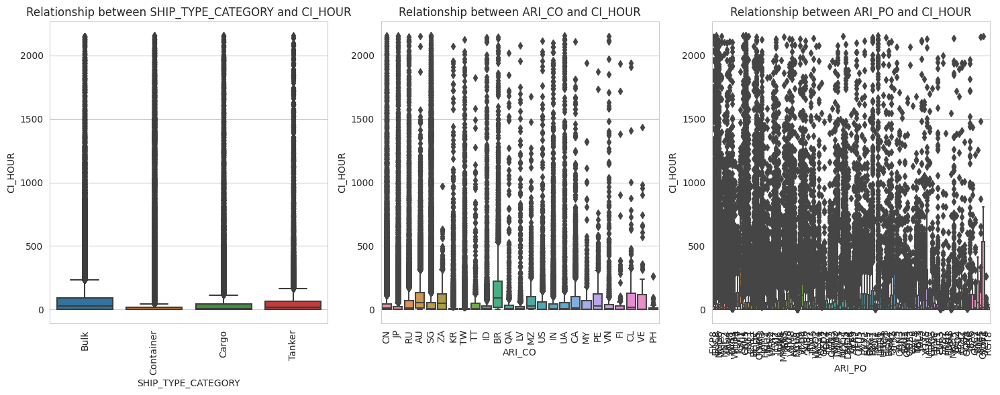

In [ ]:
# 카테고리형 변수와 CI_HOUR와의 관계를 시각화
category_columns = ['SHIP_TYPE_CATEGORY', 'ARI_CO', 'ARI_PO']

plt.figure(figsize=(15, 6))

for i, col in enumerate(category_columns, 1):
    plt.subplot(1, 3, i)
    sns.boxplot(data=train, x=col, y='CI_HOUR')
    plt.title(f'Relationship between {col} and CI_HOUR')
    plt.xticks(rotation=90)
    plt.tight_layout()

plt.show()


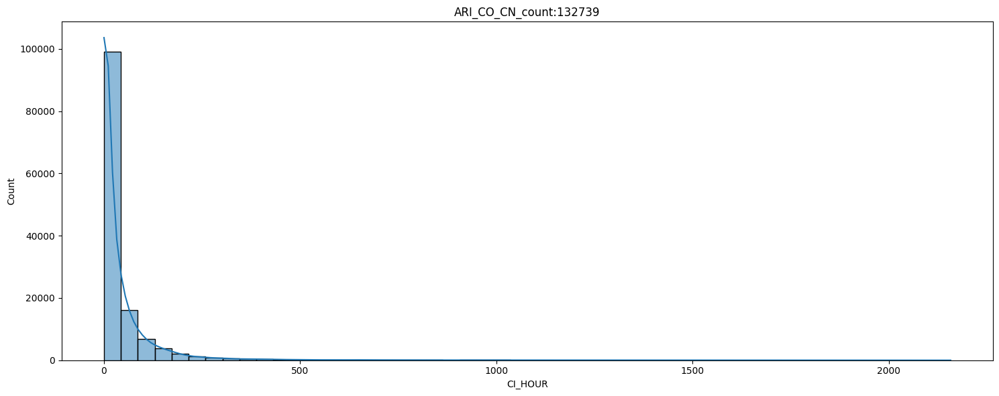

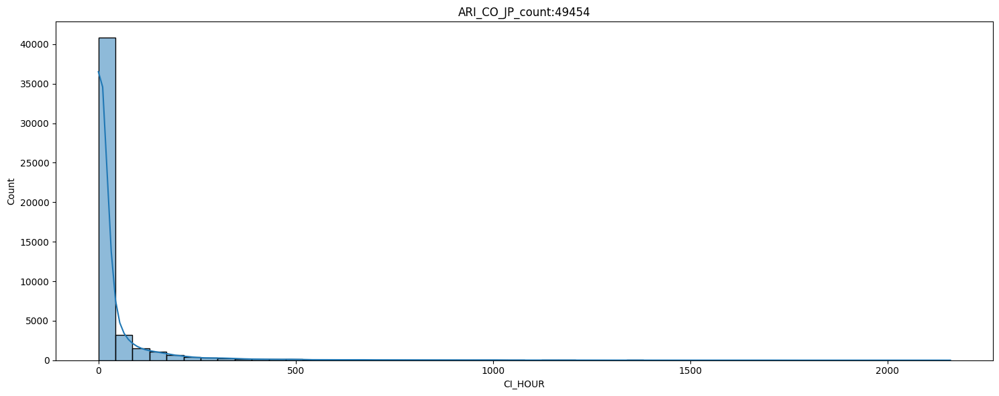

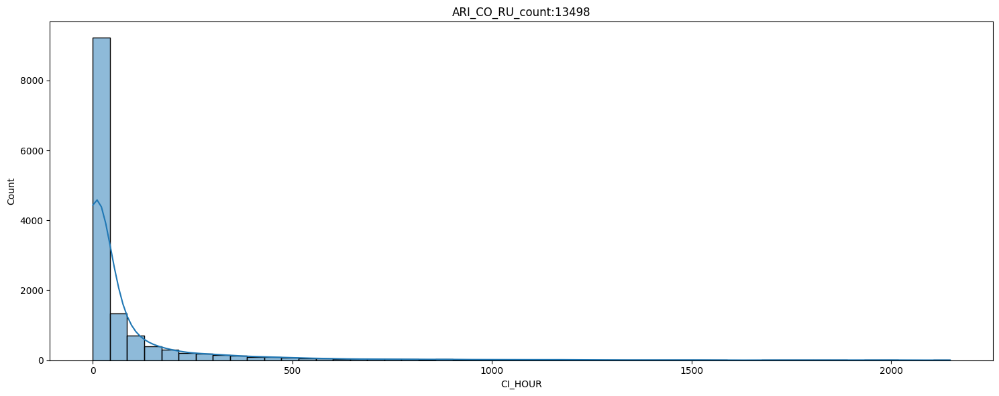

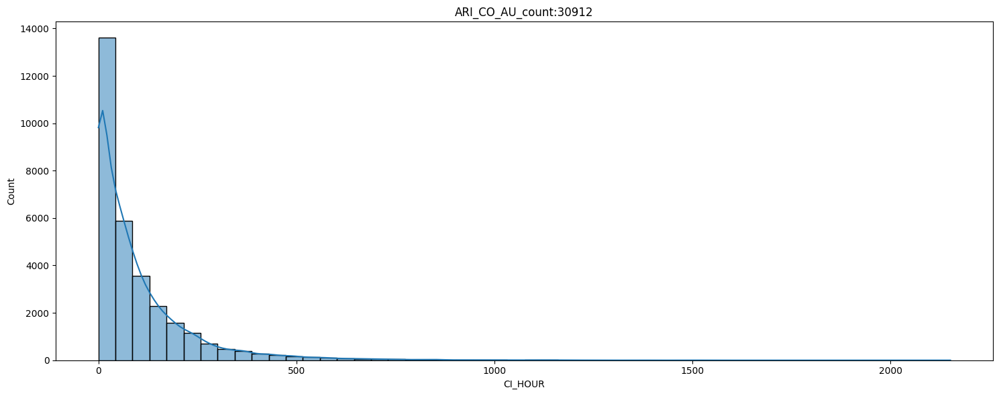

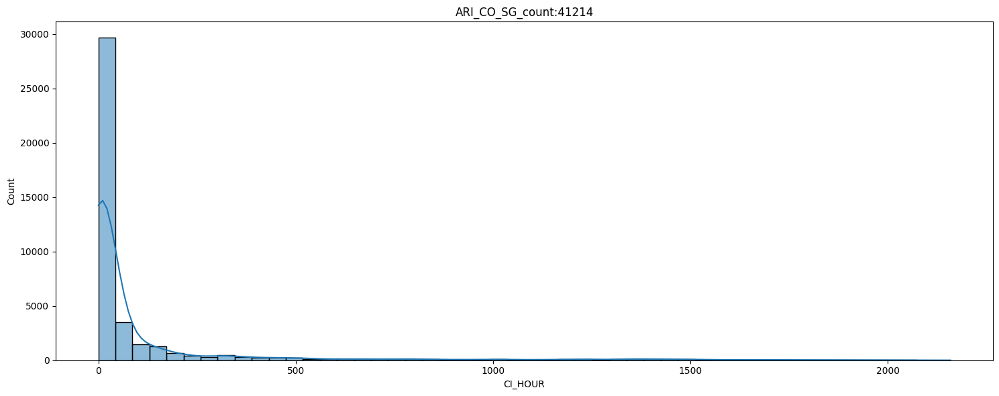

...

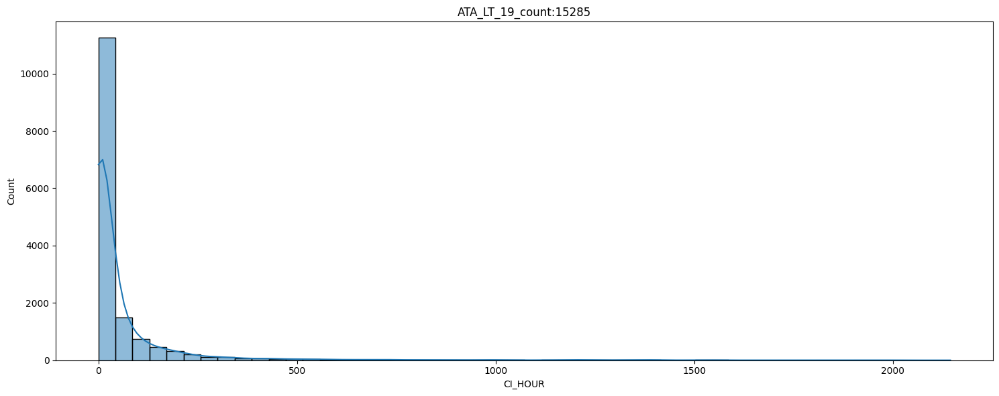

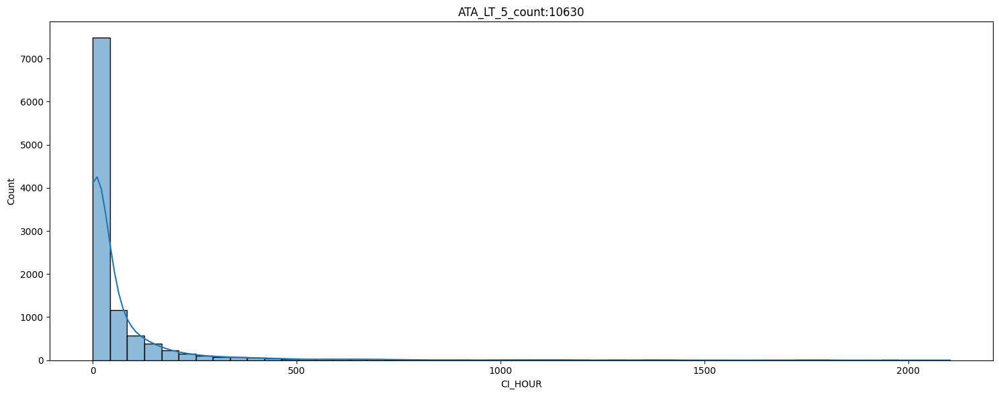

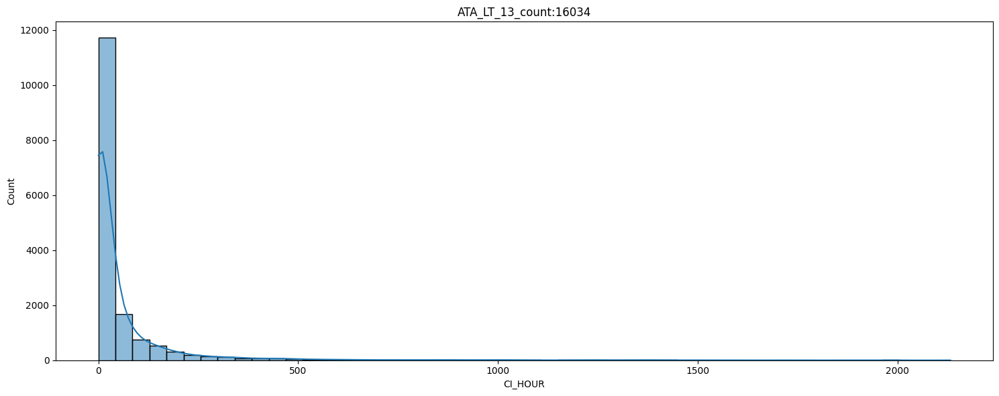

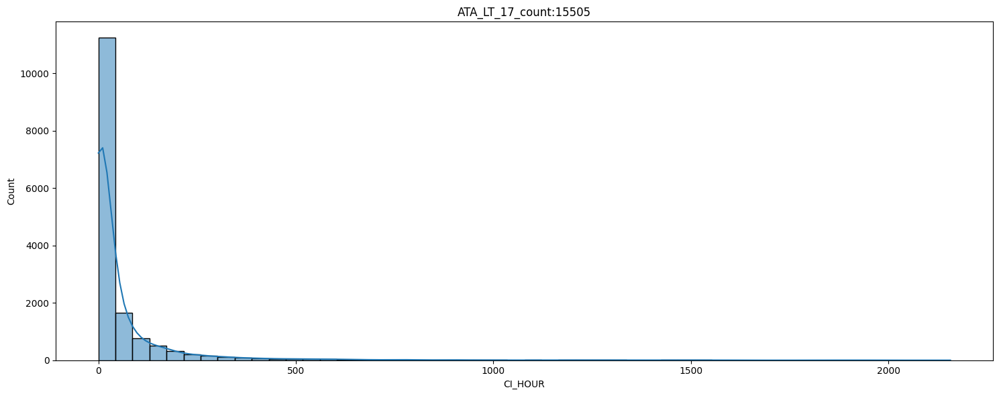

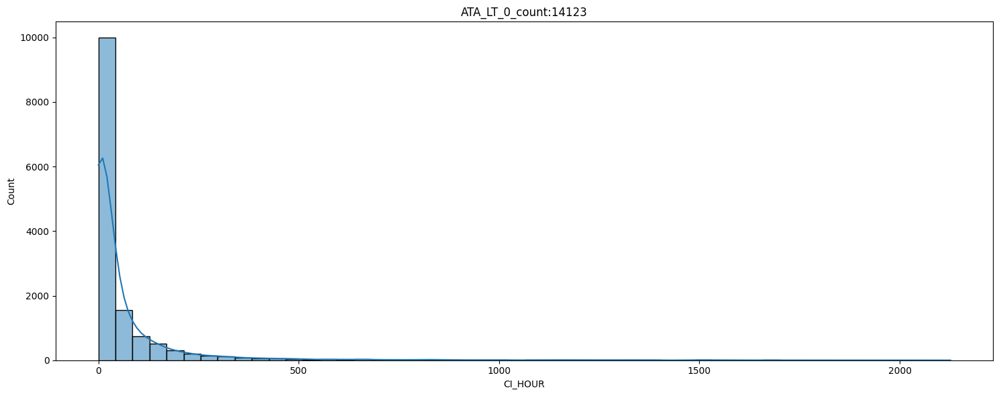

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# nunique 값이 40 이하인 피처들 선택
features_to_visualize = [col for col in train.columns if train[col].nunique() <= 40 and col != 'CI_HOUR']

for feature in features_to_visualize:
    # NaN 값을 포함한 모든 unique 값에 대해 처리
    unique_values = list(train[feature].dropna().unique()) + [None] if train[feature].isnull().any() else train[feature].unique()

    for value in unique_values:
        if pd.isna(value):
            subset_data = train[train[feature].isnull()]
            title = f"{feature}_NaN_count:{len(subset_data)}"
        else:
            subset_data = train[train[feature] == value]
            title = f"{feature}_{value}_count:{len(subset_data)}"

        plt.figure(figsize=(15, 6))
        sns.histplot(subset_data['CI_HOUR'], bins=50, kde=True)
        plt.title(title)
        plt.tight_layout()
        plt.show()


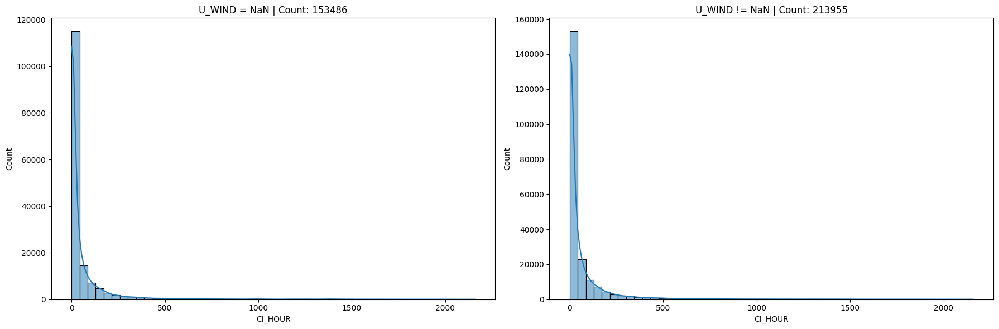

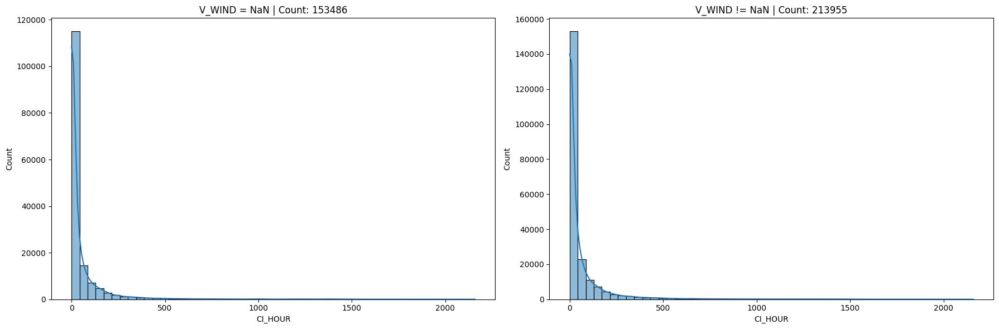

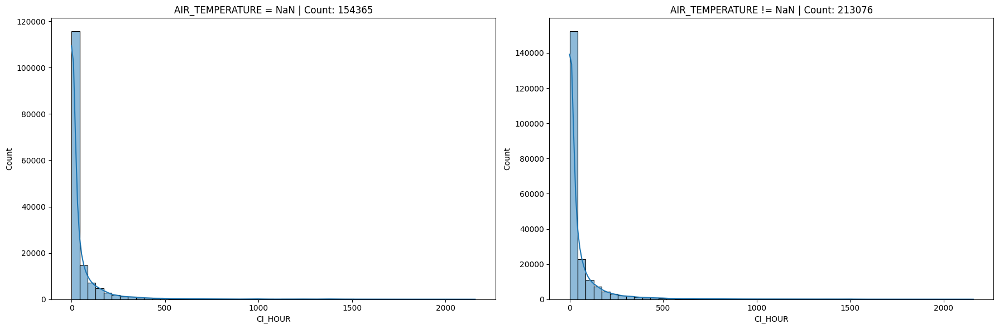

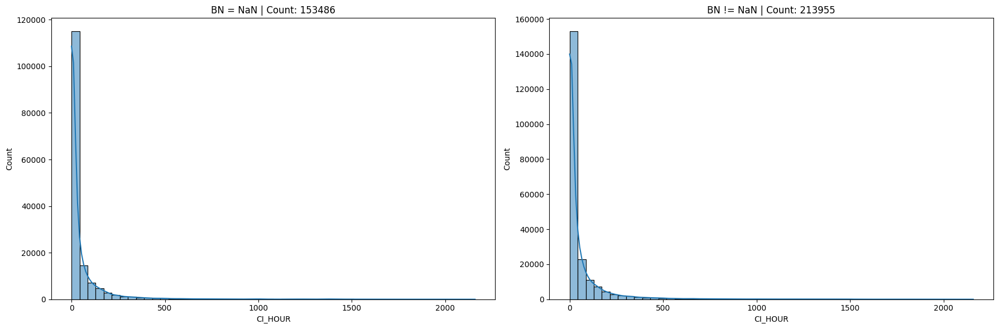

In [ ]:
features_to_visualize = ["U_WIND", "V_WIND", "AIR_TEMPERATURE", "BN"]

for feature in features_to_visualize:
    fig, axes = plt.subplots(1, 2, figsize=(18, 6))

    # NaN 값일 때의 CI_HOUR 분포
    subset_data_nan = train[train[feature].isnull()]
    sns.histplot(subset_data_nan['CI_HOUR'], bins=50, kde=True, ax=axes[0])
    axes[0].set_title(f"{feature} = NaN | Count: {len(subset_data_nan)}")

    # NaN 값이 아닐 때의 CI_HOUR 분포
    subset_data_not_nan = train[train[feature].notnull()]
    sns.histplot(subset_data_not_nan['CI_HOUR'], bins=50, kde=True, ax=axes[1])
    axes[1].set_title(f"{feature} != NaN | Count: {len(subset_data_not_nan)}")

    plt.tight_layout()
    plt.show()


In [ ]:
# 특정 피처 선택
import pandas as pd
from sklearn.manifold import TSNE
from sklearn.preprocessing import OneHotEncoder
import matplotlib.pyplot as plt
features_to_use = ['ID', 'CI_HOUR']
subset_data = train[features_to_use]

# 원-핫 인코딩
encoder = OneHotEncoder()
encoded_data = encoder.fit_transform(subset_data).toarray()

# T-SNE 적용
tsne = TSNE(n_components=2, random_state=42)
transformed_data = tsne.fit_transform(encoded_data)

# 시각화
plt.figure(figsize=(12, 10))
plt.scatter(transformed_data[:, 0], transformed_data[:, 1], s=50, cmap='viridis')
plt.title('T-SNE visualization for ID and CI_HOUR')
plt.show()

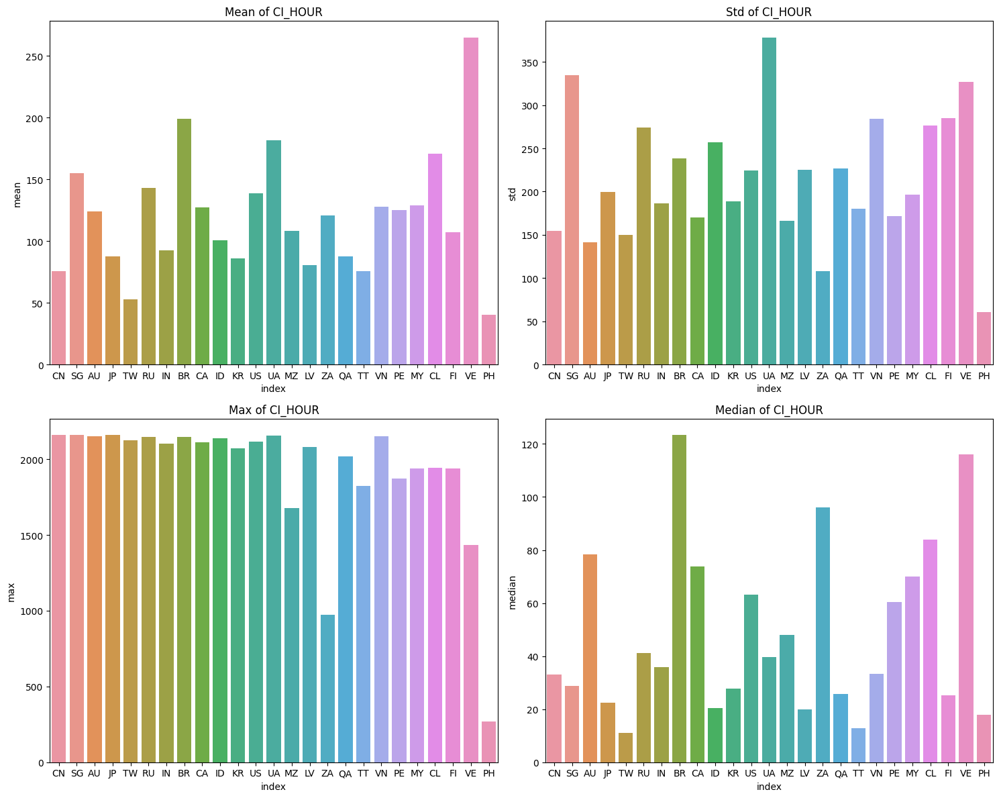

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

train_no_zero = train[train['CI_HOUR'] != 0]
# ARI_CO의 value_counts 계산
ARI_COunts = train_no_zero['ARI_CO'].value_counts()

# CI_HOUR의 mean, std, max, median 계산 및 ARI_CO로 정렬
aggregations = {
    'CI_HOUR': ['mean', 'std', 'max', 'median']
}
sorted_ari = train_no_zero.groupby(['ARI_CO']).agg(aggregations).reset_index()
sorted_ari.columns = ['ARI_CO', 'mean', 'std', 'max', 'median']
sorted_ari = sorted_ari.set_index('ARI_CO').loc[ARI_COunts.index].reset_index()

# 2x2 서브플롯 생성
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
sns.barplot(x='index', y='mean', data=sorted_ari, ax=axes[0, 0])
axes[0, 0].set_title('Mean of CI_HOUR')
sns.barplot(x='index', y='std', data=sorted_ari, ax=axes[0, 1])
axes[0, 1].set_title('Std of CI_HOUR')
sns.barplot(x='index', y='max', data=sorted_ari, ax=axes[1, 0])
axes[1, 0].set_title('Max of CI_HOUR')
sns.barplot(x='index', y='median', data=sorted_ari, ax=axes[1, 1])
axes[1, 1].set_title('Median of CI_HOUR')

plt.tight_layout()
plt.show()

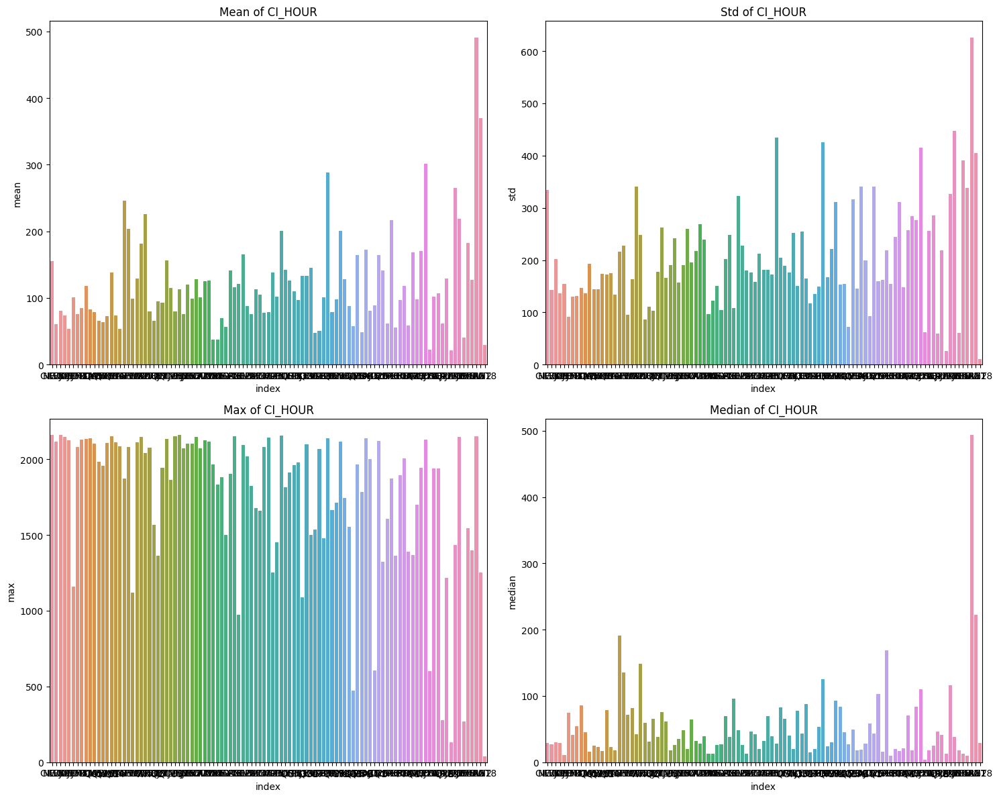

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

train_no_zero = train[train['CI_HOUR'] != 0]
# ARI_PO의 value_counts 계산
ARI_POunts = train_no_zero['ARI_PO'].value_counts()

# CI_HOUR의 mean, std, max, median 계산 및 ARI_PO로 정렬
aggregations = {
    'CI_HOUR': ['mean', 'std', 'max', 'median']
}
sorted_ari = train_no_zero.groupby(['ARI_PO']).agg(aggregations).reset_index()
sorted_ari.columns = ['ARI_PO', 'mean', 'std', 'max', 'median']
sorted_ari = sorted_ari.set_index('ARI_PO').loc[ARI_POunts.index].reset_index()

# 2x2 서브플롯 생성
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
sns.barplot(x='index', y='mean', data=sorted_ari, ax=axes[0, 0])
axes[0, 0].set_title('Mean of CI_HOUR')
sns.barplot(x='index', y='std', data=sorted_ari, ax=axes[0, 1])
axes[0, 1].set_title('Std of CI_HOUR')
sns.barplot(x='index', y='max', data=sorted_ari, ax=axes[1, 0])
axes[1, 0].set_title('Max of CI_HOUR')
sns.barplot(x='index', y='median', data=sorted_ari, ax=axes[1, 1])
axes[1, 1].set_title('Median of CI_HOUR')

plt.tight_layout()
plt.show()

In [ ]:
sorted_ari

,ARI_PO,ARI_CO,mean,std,max,median,ARI_CO_order
4,BGX4,CN,133.664229,255.109037,2098.553611,43.552500,0
13,EKP8,CN,80.313924,137.208951,2148.446389,36.754306,0
15,EUC8,CN,80.302219,202.492848,2157.861389,29.901389,0
21,FTQ1,CN,59.119061,147.729846,1388.009722,20.615694,0
30,JDG8,CN,182.740440,390.385314,1544.396667,13.229444,0
...,...,...,...,...,...,...,...
39,LHD1,MY,141.698298,159.758847,1322.722222,103.277083,20
23,GQJ7,CL,170.728502,276.719578,1941.667222,83.891944,21
8,DEJ2,FI,107.053598,285.247050,1937.332500,25.167500,22
31,JEA6,VE,264.985667,326.918557,1433.078611,115.986667,23


KeyboardInterrupt: ignored

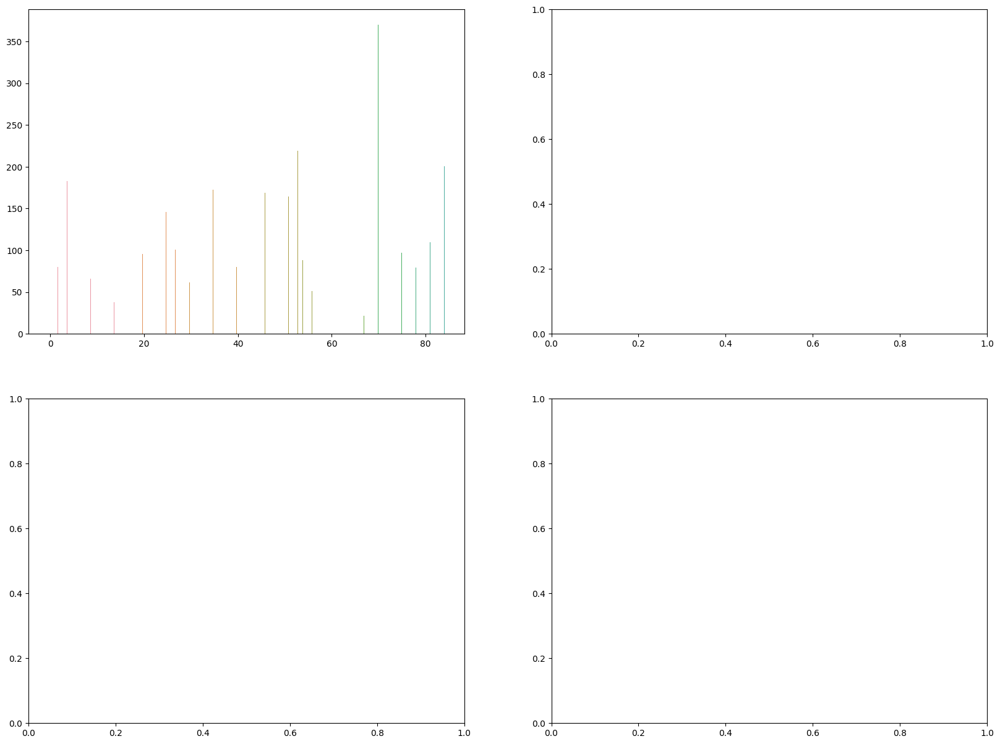

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

train_no_zero = train[train['CI_HOUR'] != 0]

# ARI_CO의 순서를 얻음
ARI_CO_order = train_no_zero['ARI_CO'].value_counts().index

# ARI_PO의 value_counts 계산
ARI_PO_counts = train_no_zero['ARI_PO'].value_counts()

# CI_HOUR의 mean, std, max, median 계산 및 ARI_PO로 정렬
aggregations = {
    'CI_HOUR': ['mean', 'std', 'max', 'median']
}
sorted_ari = train_no_zero.groupby(['ARI_PO', 'ARI_CO']).agg(aggregations).reset_index()
sorted_ari.columns = ['ARI_PO', 'ARI_CO', 'mean', 'std', 'max', 'median']

# ARI_CO 순서에 따라 데이터를 정렬
sorted_ari['ARI_CO_order'] = sorted_ari['ARI_CO'].map(lambda x: ARI_CO_order.get_loc(x))
sorted_ari = sorted_ari.sort_values(['ARI_CO_order', 'ARI_PO'])

# 2x2 서브플롯 생성
fig, axes = plt.subplots(2, 2, figsize=(20, 15))
sns.barplot(x='ㅑㅜㅇ', y='mean', hue='ARI_CO', data=sorted_ari, ax=axes[0, 0])
axes[0, 0].set_title('Mean of CI_HOUR')
sns.barplot(x='ㅑㅜㅇ', y='std', hue='ARI_CO', data=sorted_ari, ax=axes[0, 1])
axes[0, 1].set_title('Std of CI_HOUR')
sns.barplot(x='ㅑㅜㅇ', y='max', hue='ARI_CO', data=sorted_ari, ax=axes[1, 0])
axes[1, 0].set_title('Max of CI_HOUR')
sns.barplot(x='ㅑㅜㅇ', y='median', hue='ARI_CO', data=sorted_ari, ax=axes[1, 1])
axes[1, 1].set_title('Median of CI_HOUR')

# 회전시켜 x축 레이블이 겹치지 않게 함
for ax in axes.ravel():
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')

plt.tight_layout()
plt.show()


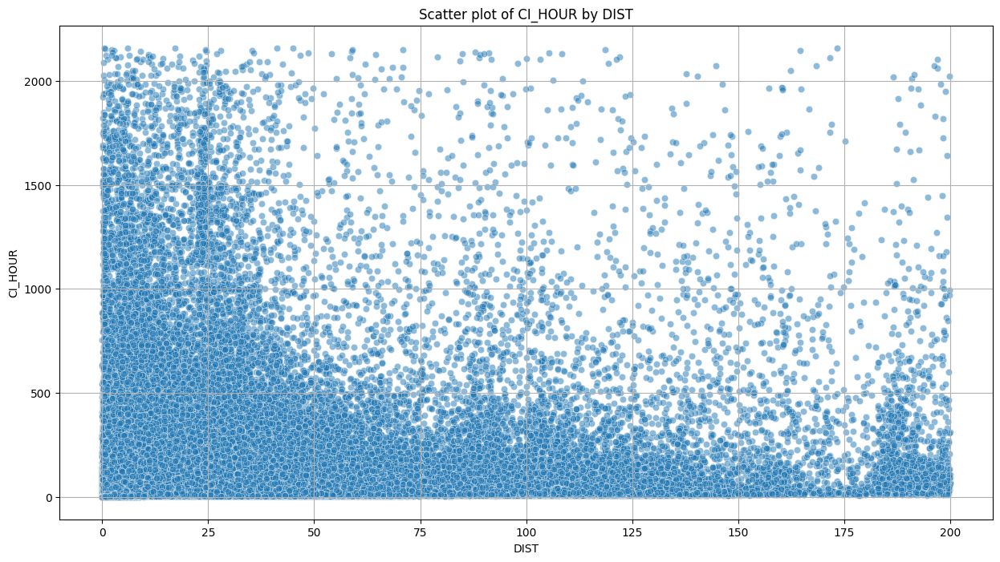

In [ ]:
# Scatter plot 다시 시도
plt.figure(figsize=(15, 8))
sns.scatterplot(x=train_no_zero['DIST'], y=train_no_zero['CI_HOUR'], alpha=0.5)
plt.title("Scatter plot of CI_HOUR by DIST")
plt.xlabel("DIST")
plt.ylabel("CI_HOUR")
plt.grid(True)
plt.show()

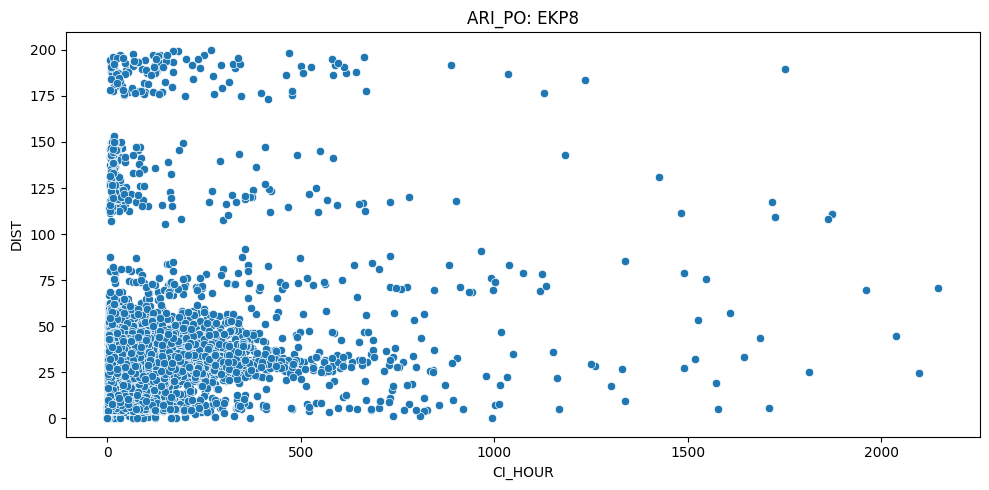

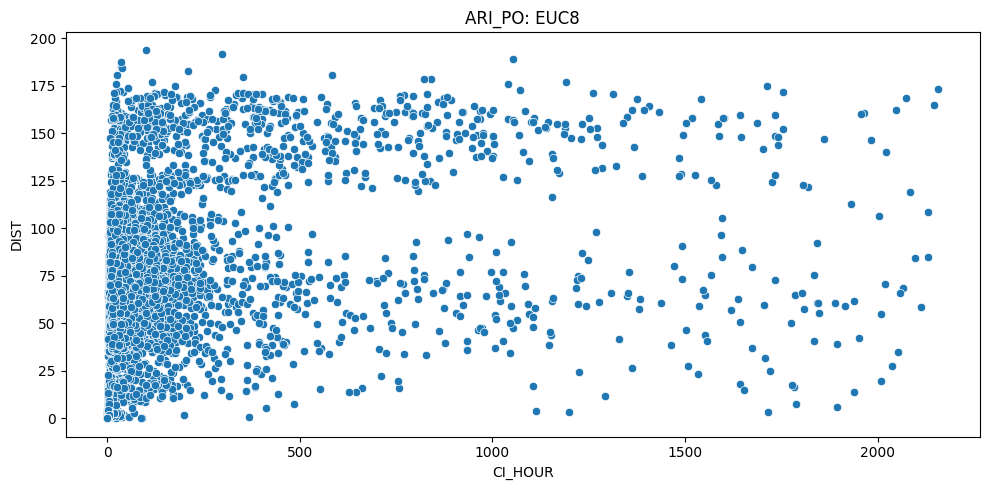

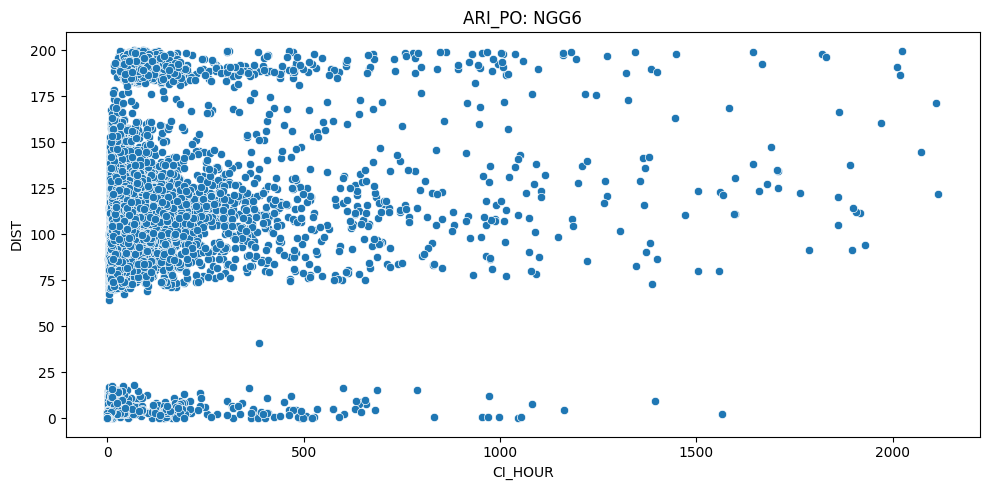

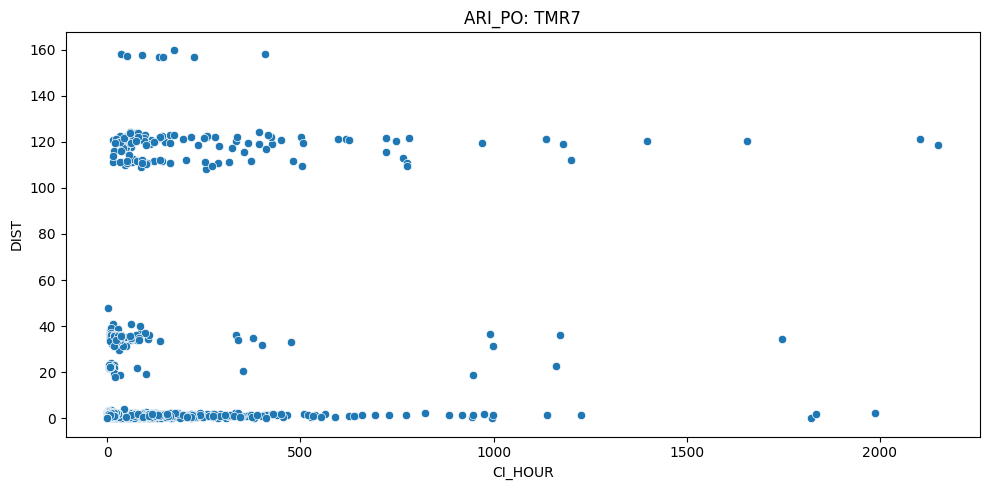

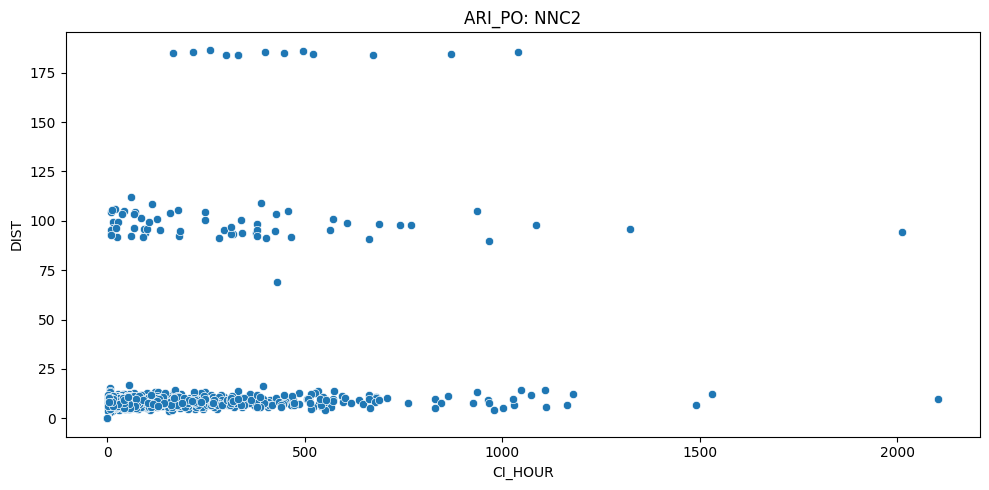

...

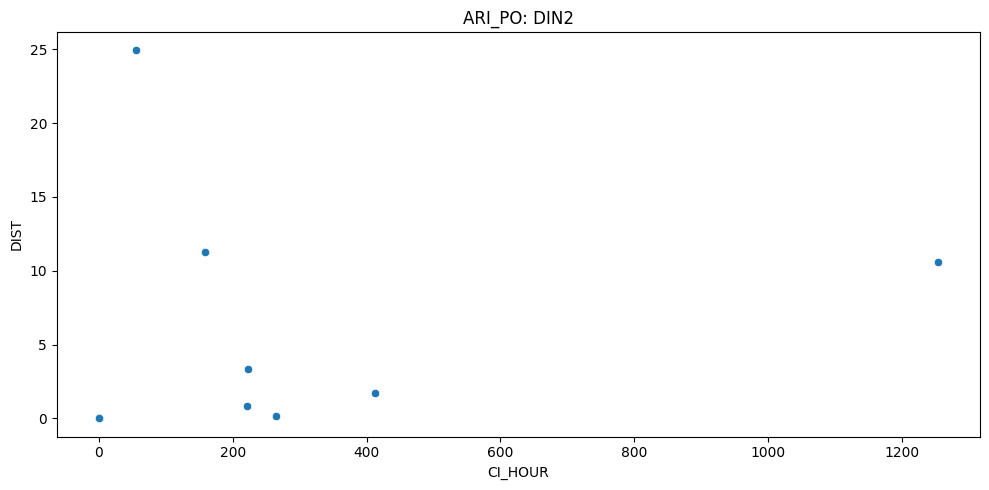

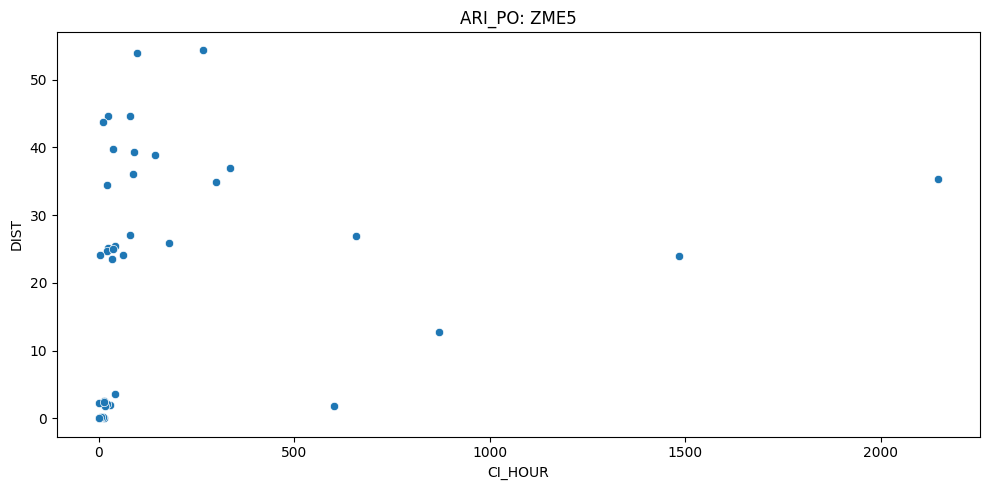

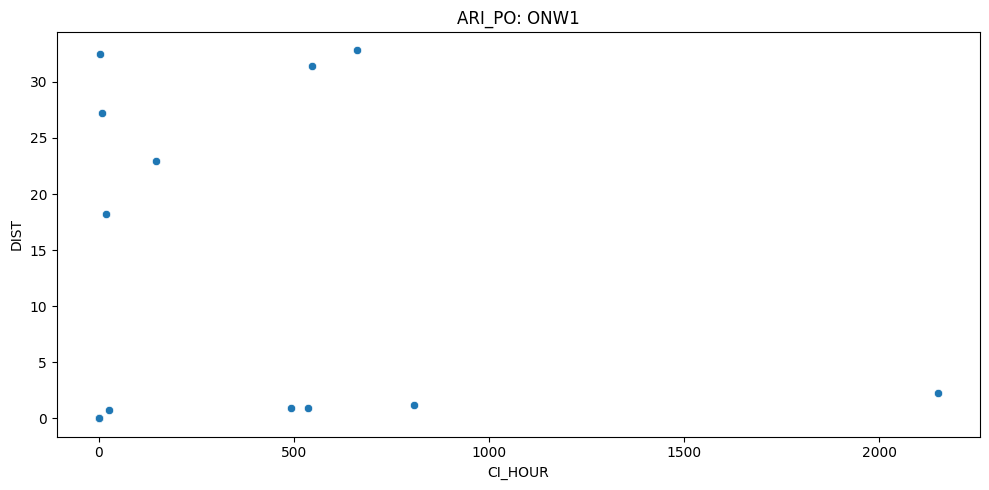

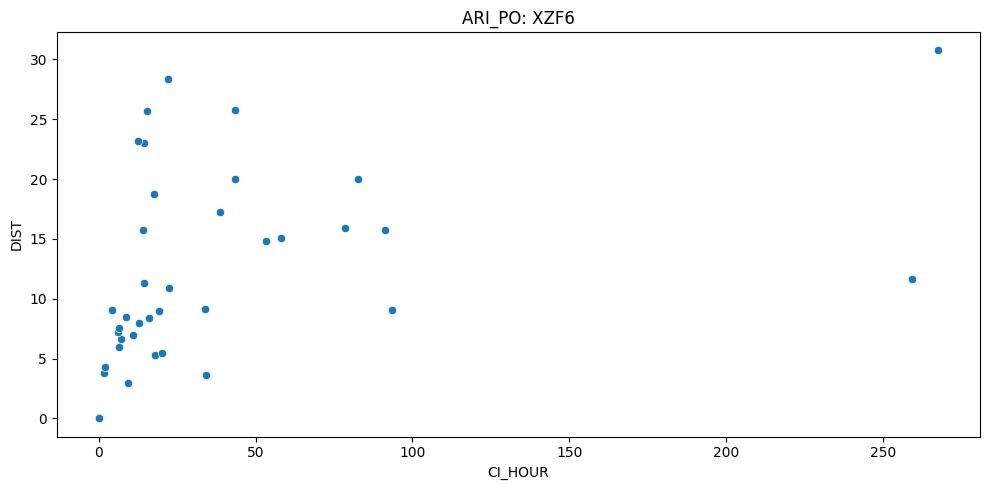

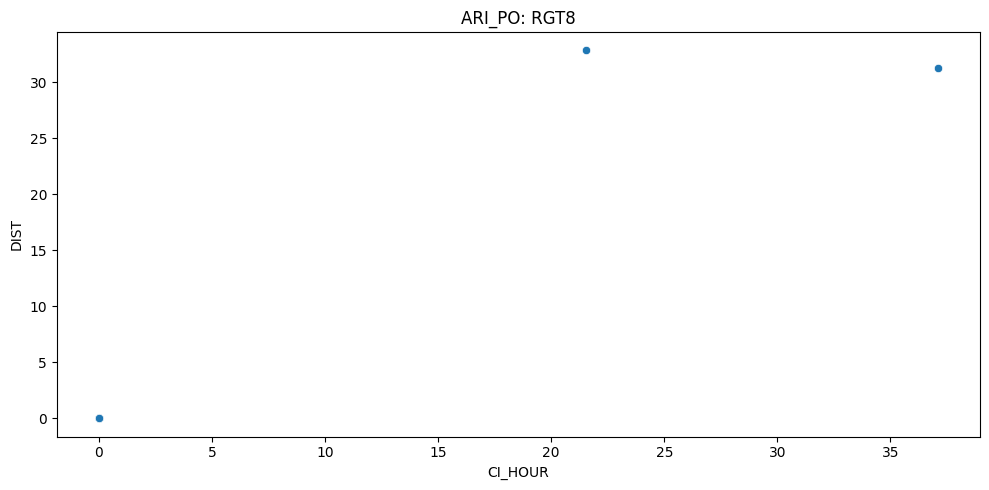

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 'ARI_PO'의 unique 값들을 얻습니다.
ari_pos = train['ARI_PO'].unique()

# 각 'ARI_PO' 값별로 scatter plot을 그립니다.
for ari_po in ari_pos:
    subset = train[train['ARI_PO'] == ari_po]

    # scatter plot
    plt.figure(figsize=(10, 5))
    sns.scatterplot(data=subset, x='CI_HOUR', y='DIST')
    plt.title(f"ARI_PO: {ari_po}")
    plt.tight_layout()
    plt.show()


In [ ]:
train[(train['ARI_PO'] == "UVK6") & (train['DIST'] < 175) & (train['DIST'] > 125)].to_csv('UVK6_150.csv',index=False)
train[(train['ARI_PO'] == "UVK6") & (train['DIST'] < 100)].to_csv('UVK6_25.csv',index=False)
train[(train['ARI_PO'] == "UVK6") & (train['DIST'] > 175)].to_csv('UVK6_175.csv',index=False)

In [ ]:
train['ID'].nunique()

24764

In [ ]:
train['ID'] = train['ID'].str[0]
test['ID'] = test['ID'].str[0]


In [ ]:
# 'ARI_PO'의 unique 값들을 얻습니다.
ari_pos = train['ARI_PO'].unique()

# 각 'ARI_PO' 값별로 scatter plot을 그립니다.
for ari_po in ari_pos:
    subset = train[train['ARI_PO'] == ari_po]
    subset = subset[subset["hour"] < 8]
    # scatter plot
    plt.figure(figsize=(10, 5))
    sns.scatterplot(data=subset, x='DIST', y='CI_HOUR', hue='DEADWEIGHT', palette='tab10', legend="full")
    plt.title(f"ARI_PO: {ari_po}")
    plt.tight_layout()
    plt.legend(loc='upper right')
    plt.show()

<ipython-input-46-248fa7d04836>:12: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


KeyboardInterrupt: ignored

In [ ]:
train['new_feature'] = train['ARI_PO'].astype(str) + "_" + train['year'].astype(str)  + "_" + train['month'].astype(str)  + "_" + train['day'].astype(str)
train